<a href="https://colab.research.google.com/github/navaneethkomuravelli/explainable_Ai_2374/blob/main/XAI_ResearchPaper_2374_2064_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Data Augmentation and Model Building.**

###**Data-Preprocessing**

In [1]:
import pandas as pd
import numpy as np

In [ ]:
%pip install catboost

In [3]:
df= pd.read_excel('/content/health_lifestyle_dataset.csv.xlsx')
df.head()

,id,age,gender,bmi,daily_steps,sleep_hours,water_intake_l,calories_consumed,smoker,alcohol,resting_hr,systolic_bp,diastolic_bp,cholesterol,family_history,disease_risk
0,1,56,Male,20.5,4198,3.9,3.4,1602,0,0,97,161,111,240,0,1
1,2,69,Female,33.3,14359,9.0,4.7,2346,0,1,68,116,65,207,0,1
2,3,46,Male,31.6,1817,6.6,4.2,1643,0,1,90,123,99,296,0,1
3,4,32,Female,38.2,15772,3.6,2.0,2460,0,0,71,165,95,175,0,1
4,5,60,Female,33.6,6037,3.8,4.0,3756,0,1,98,139,61,294,0,1


In [4]:
df["disease_risk"] = (
    (df["bmi"] > 30).astype(int) +
    (df["smoker"] == 1).astype(int) +
    (df["alcohol"] == 1).astype(int) +
    (df["cholesterol"] > 240).astype(int) +
    (df["family_history"] == 1).astype(int)
)
df["disease_risk"] = (df["disease_risk"] > 2).astype(int)


In [5]:
#Getting Feature Names and how many na values it has.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 100000 non-null  int64  
 1   age                100000 non-null  int64  
 2   gender             100000 non-null  object 
 3   bmi                100000 non-null  float64
 4   daily_steps        100000 non-null  int64  
 5   sleep_hours        100000 non-null  float64
 6   water_intake_l     100000 non-null  float64
 7   calories_consumed  100000 non-null  int64  
 8   smoker             100000 non-null  int64  
 9   alcohol            100000 non-null  int64  
 10  resting_hr         100000 non-null  int64  
 11  systolic_bp        100000 non-null  int64  
 12  diastolic_bp       100000 non-null  int64  
 13  cholesterol        100000 non-null  int64  
 14  family_history     100000 non-null  int64  
 15  disease_risk       100000 non-null  int64  
dtypes: 

In [6]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings
warnings.filterwarnings("ignore")


df = pd.read_excel("health_lifestyle_dataset.csv.xlsx").drop(columns=["id"])

# Encode categorical
df["gender"] = df["gender"].map({"Male": 1, "Female": 0})


df["disease_risk"] = (
    (df["bmi"] > 30).astype(int)
    + (df["smoker"] == 1).astype(int)
    + (df["alcohol"] == 1).astype(int)
    + (df["cholesterol"] > 240).astype(int)
    + (df["family_history"] == 1).astype(int)
)
df["disease_risk"] = (df["disease_risk"] > 2).astype(int)

X = df.drop("disease_risk", axis=1)
y = df["disease_risk"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)


scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

sm = SMOTE(random_state=42)
X_train, y_train = sm.fit_resample(X_train, y_train)


results = {}

# Logistic Regression
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)
pred_lr = lr.predict(X_test)
results["Logistic Regression"] = accuracy_score(y_test, pred_lr)

# Decision Tree
dt = DecisionTreeClassifier(max_depth=12, min_samples_split=5, random_state=42)
dt.fit(X_train, y_train)
pred_dt = dt.predict(X_test)
results["Decision Tree"] = accuracy_score(y_test, pred_dt)

# Random Forest
rf = RandomForestClassifier(n_estimators=400, max_depth=12, random_state=42)
rf.fit(X_train, y_train)
pred_rf = rf.predict(X_test)
results["Random Forest"] = accuracy_score(y_test, pred_rf)

# XGBoost
xgb = XGBClassifier(
    n_estimators=400,
    learning_rate=0.05,
    max_depth=8,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='logloss',
    random_state=42
)
xgb.fit(X_train, y_train)
pred_xgb = xgb.predict(X_test)
results["XGBoost"] = accuracy_score(y_test, pred_xgb)

# CatBoost
cat = CatBoostClassifier(
    iterations=400,
    depth=8,
    learning_rate=0.05,
    verbose=0,
    random_seed=42
)
cat.fit(X_train, y_train)
pred_cat = cat.predict(X_test)
results["CatBoost"] = accuracy_score(y_test, pred_cat)

# ANN (Neural Network)
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=25, batch_size=64, verbose=0)

ann_pred = (model.predict(X_test) > 0.5).astype(int).flatten()
results["ANN"] = accuracy_score(y_test, ann_pred)


print("\n===== MODEL ACCURACY RESULTS =====")
for name, acc in results.items():
    print(f"{name:<20}: {acc*100:.2f}%")


print("\n===== DETAILED METRICS =====")
models_preds = {
    "Logistic Regression": pred_lr,
    "Decision Tree": pred_dt,
    "Random Forest": pred_rf,
    "XGBoost": pred_xgb,
    "CatBoost": pred_cat,
    "ANN": ann_pred
}

for name, preds in models_preds.items():
    print(f"\n{name}")
    print(classification_report(y_test, preds))


625/625 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

===== MODEL ACCURACY RESULTS =====
Logistic Regression : 95.05%
Decision Tree       : 99.93%
Random Forest       : 100.00%
XGBoost             : 99.98%
CatBoost            : 99.97%
ANN                 : 99.72%

===== DETAILED METRICS =====

Logistic Regression
              precision    recall  f1-score   support

           0       0.99      0.95      0.97     16012
           1       0.82      0.95      0.88      3988

    accuracy                           0.95     20000
   macro avg       0.91      0.95      0.93     20000
weighted avg       0.96      0.95      0.95     20000


Decision Tree
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     16012
           1       1.00      1.00      1.00      3988

    accuracy                           1.00     20000
   macro avg       1.00      1.00      1.00     20000
weighted avg       1.00      1.00      1.00     20000


Random Forest
             

In [7]:
cat_cols = X.select_dtypes(include=['object']).columns
le = LabelEncoder()
for col in cat_cols:
    X[col] = le.fit_transform(X[col])

In [8]:
X.head()

,age,gender,bmi,daily_steps,sleep_hours,water_intake_l,calories_consumed,smoker,alcohol,resting_hr,systolic_bp,diastolic_bp,cholesterol,family_history
0,56,1,20.5,4198,3.9,3.4,1602,0,0,97,161,111,240,0
1,69,0,33.3,14359,9.0,4.7,2346,0,1,68,116,65,207,0
2,46,1,31.6,1817,6.6,4.2,1643,0,1,90,123,99,296,0
3,32,0,38.2,15772,3.6,2.0,2460,0,0,71,165,95,175,0
4,60,0,33.6,6037,3.8,4.0,3756,0,1,98,139,61,294,0


In [9]:
y.head()

,disease_risk
0,0
1,0
2,1
3,0
4,1


In [10]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Encode gender
le = LabelEncoder()
df['gender'] = le.fit_transform(df['gender'])  # Male=1, Female=0



# Split data
X = df.drop('disease_risk', axis=1)
y = df['disease_risk']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Scale numeric features
scaler = StandardScaler()
X_train['age'] = scaler.fit_transform(X_train[['age']])
X_test['age'] = scaler.transform(X_test[['age']])

In [11]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

print("Shape of X_train before SMOTE:", X_train.shape)
print("Shape of X_train after SMOTE:", X_train_resampled.shape)
print("Distribution of y_train before SMOTE:\n", y_train.value_counts())
print("Distribution of y_train after SMOTE:\n", y_train_resampled.value_counts())

Shape of X_train before SMOTE: (80000, 14)
Shape of X_train after SMOTE: (128092, 14)
Distribution of y_train before SMOTE:
 disease_risk
0    64046
1    15954
Name: count, dtype: int64
Distribution of y_train after SMOTE:
 disease_risk
0    64046
1    64046
Name: count, dtype: int64


In [12]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score
)
import pandas as pd
import numpy as np

y_prob_ann = model.predict(X_test).ravel()
y_prob_xgb = xgb.predict_proba(X_test)[:, 1]
y_prob_dt  = dt.predict_proba(X_test)[:, 1]
y_prob_rf  = rf.predict_proba(X_test)[:, 1]
y_prob_lr  = lr.predict_proba(X_test)[:, 1]
y_prob_cb  = cat.predict_proba(X_test)[:, 1]

# Store predictions and probabilities
model_preds = {
    "Logistic Regression": (pred_lr, y_prob_lr),
    "Decision Tree": (pred_dt, y_prob_dt),
    "Random Forest": (pred_rf, y_prob_rf),
    "XGBoost": (pred_xgb, y_prob_xgb),
    "CatBoost": (pred_cat, y_prob_cb),
    "ANN": (ann_pred, y_prob_ann)
}


results = []

for name, (y_pred, y_prob) in model_preds.items():
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)

    results.append([name, acc, prec, rec, f1, auc])


comparison_table = pd.DataFrame(
    results,
    columns=["Model", "Accuracy", "Precision", "Recall", "F1-Score", "AUC"]
)

# Convert metrics to %
for col in ["Accuracy", "Precision", "Recall", "F1-Score", "AUC"]:
    comparison_table[col] = (comparison_table[col] * 100).round(2)

comparison_table = comparison_table.sort_values(by="Accuracy", ascending=False).reset_index(drop=True)

print("\n===== MODEL PERFORMANCE COMPARISON =====")
print(comparison_table.to_string(index=False))


625/625 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

===== MODEL PERFORMANCE COMPARISON =====
              Model  Accuracy  Precision  Recall  F1-Score   AUC
      Random Forest    100.00     100.00  100.00    100.00 84.16
            XGBoost     99.98      99.90  100.00     99.95 50.00
           CatBoost     99.96      99.82  100.00     99.91 87.16
      Decision Tree     99.93      99.65  100.00     99.82 50.00
                ANN     99.72      99.13   99.47     99.30 51.81
Logistic Regression     95.04      82.44   95.49     88.49 50.00


Now, we will retrain the models using the resampled training data.

#**SHAP Explainability.**

In [ ]:
!pip install shap

In [14]:
import shap

ROC CURVE

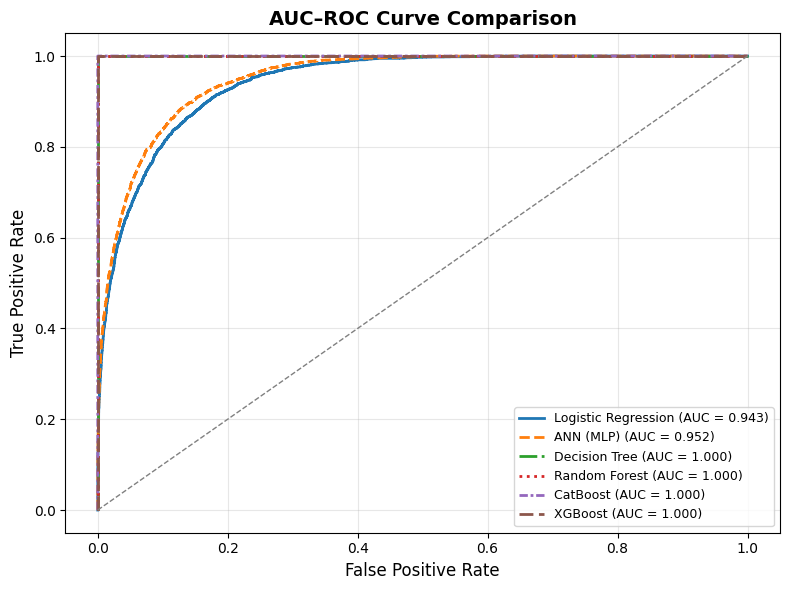

In [15]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

# -------------------------------
# 1. Define Models
# -------------------------------
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "ANN (MLP)": MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=500, random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "XGBoost": XGBClassifier(eval_metric='logloss', use_label_encoder=False, random_state=42)
}

# -------------------------------
# 2. Plot ROC Curves
# -------------------------------
plt.figure(figsize=(8, 6))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
linestyles = ['-', '--', '-.', ':', (0, (3, 1, 1, 1)), (0, (5, 2))]

for (name, model), color, ls in zip(models.items(), colors, linestyles):
    model.fit(X_train, y_train)
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, linestyle=ls, lw=2, label=f"{name} (AUC = {roc_auc:.3f})")

# -------------------------------
# 3. Formatting
# -------------------------------
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
plt.title("AUC–ROC Curve Comparison", fontsize=14, fontweight='bold')
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.legend(loc="lower right", fontsize=9, frameon=True)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


###**ANN MODEL**

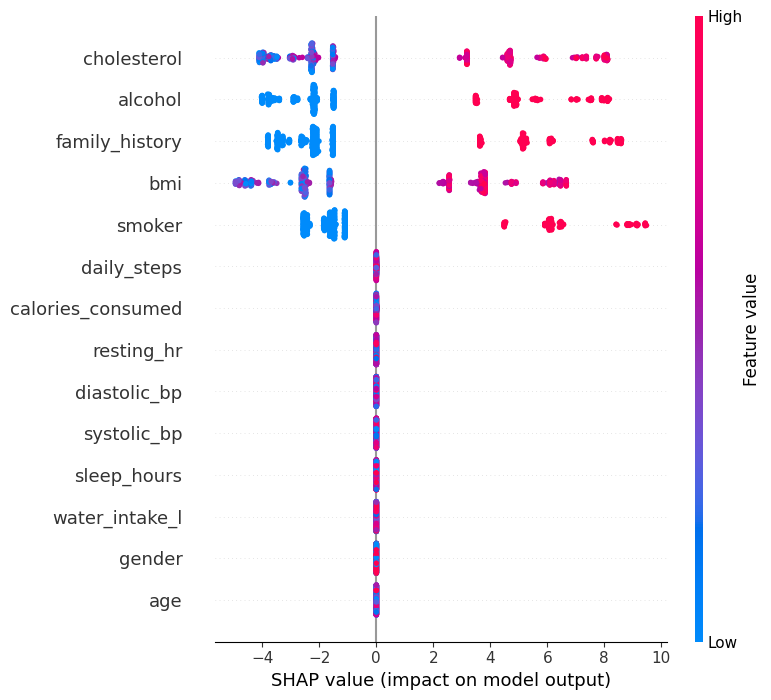

In [16]:
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test[:500])

shap.summary_plot(shap_values, X_test[:500], feature_names=X.columns)

###**XGBoost MODEL**

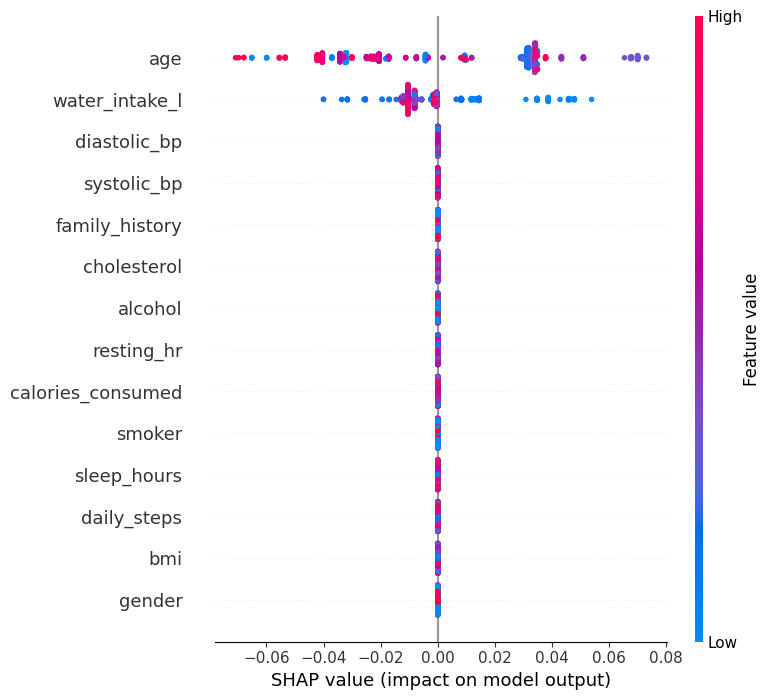

In [17]:
explainer = shap.Explainer(xgb, X_train)
shap_values = explainer(X_test[:500])

shap.summary_plot(shap_values, X_test[:500], feature_names=X.columns)

###**Decision Tree**

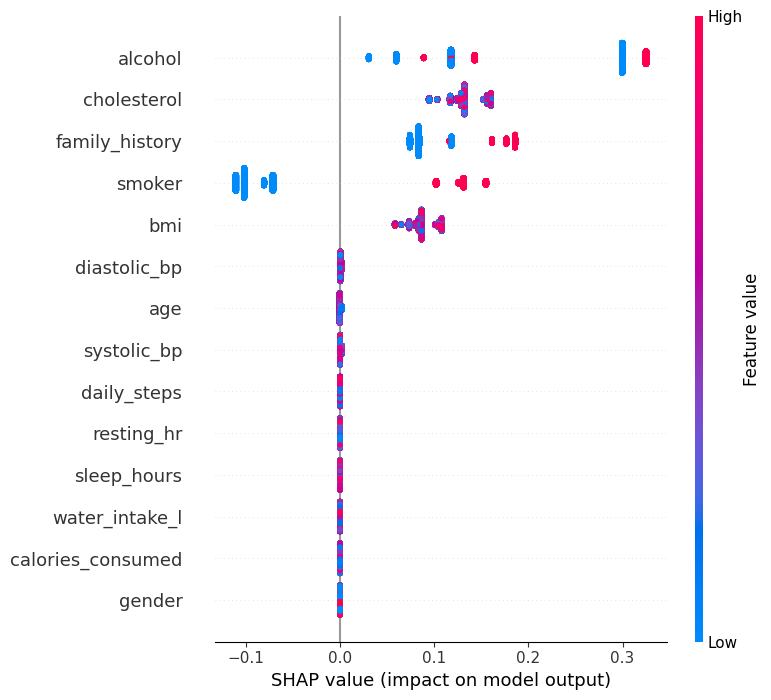

In [18]:
explainer_dt = shap.TreeExplainer(dt)
shap_values_dt = explainer_dt.shap_values(X_test)


if isinstance(shap_values_dt, list):
    shap_values_dt = shap_values_dt[1]
else:
    shap_values_dt = shap_values_dt[..., 1]

shap.summary_plot(shap_values_dt, X_test, feature_names=X.columns, plot_type='dot')

###**Random Forest**

 94%|=================== | 942/1000 [00:11<00:00]       

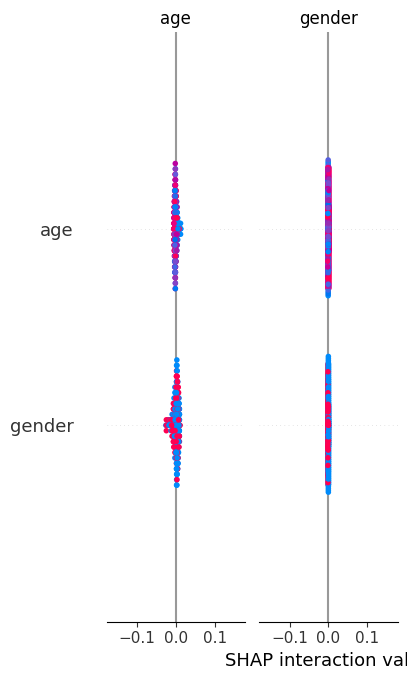

In [19]:
explainer = shap.Explainer(rf, X_train)
shap_values = explainer(X_test[:500])

shap.summary_plot(shap_values, X_test[:500], feature_names=X.columns)

###**CatBoost**

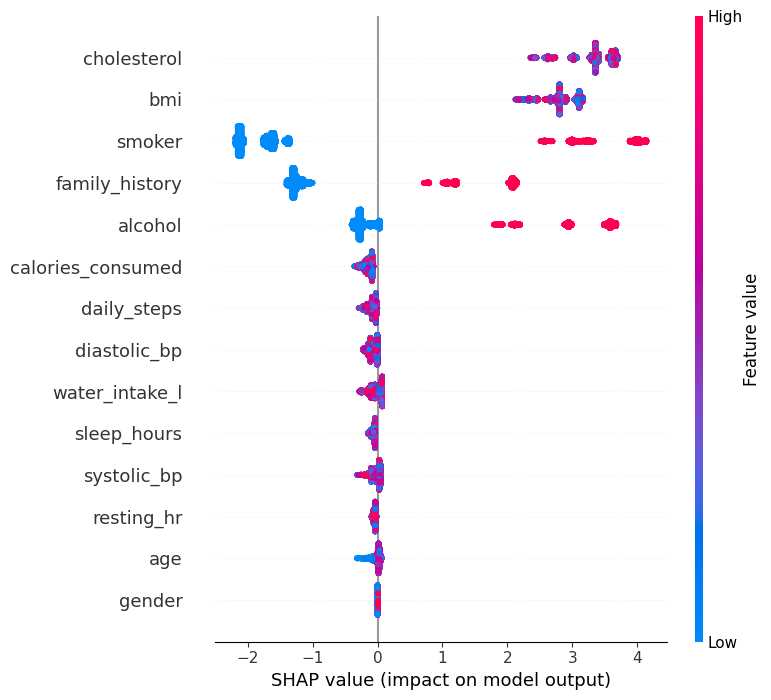

In [20]:
explainer = shap.TreeExplainer(cat)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test, feature_names=X.columns)

###**Logistic Regression**

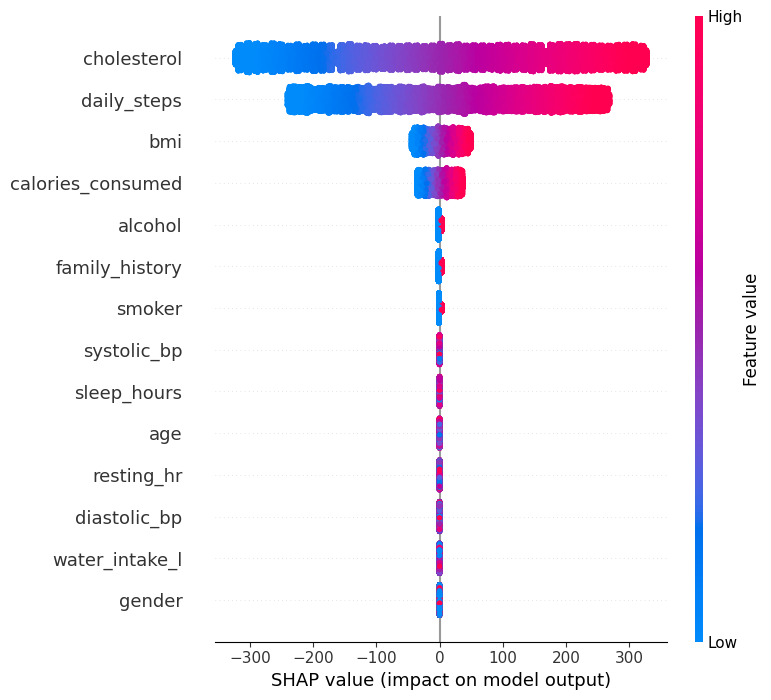

In [21]:
explainer = shap.LinearExplainer(lr, X_train)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test, feature_names=X.columns)

#**Lime**

In [ ]:
!pip install lime

In [23]:
import lime
import lime.lime_tabular

In [24]:
X_train_array = X_train.values
X_test_array = X_test.values

In [25]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_array,
    feature_names=X_train.columns,
    class_names=["Low Risk", "High Risk"],
    mode="classification"
)


###**ANN MODEL**

In [30]:
exp_model = lime_explainer.explain_instance(
    X_test.values[i],
    predict_fn=xgb.predict_proba,
    num_features=10
)
exp_model.show_in_notebook(show_table=True)

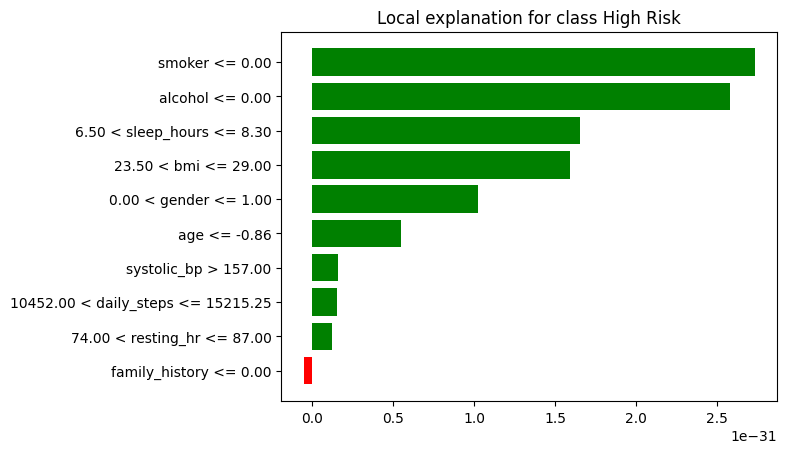

In [32]:
%matplotlib inline
fig = exp_model.as_pyplot_figure()

###**XGBoost MODEL**

In [33]:
exp_xgb = lime_explainer.explain_instance(
    X_test.values[i],
    predict_fn=xgb.predict_proba,
    num_features=10
)
exp_xgb.show_in_notebook(show_table=True)

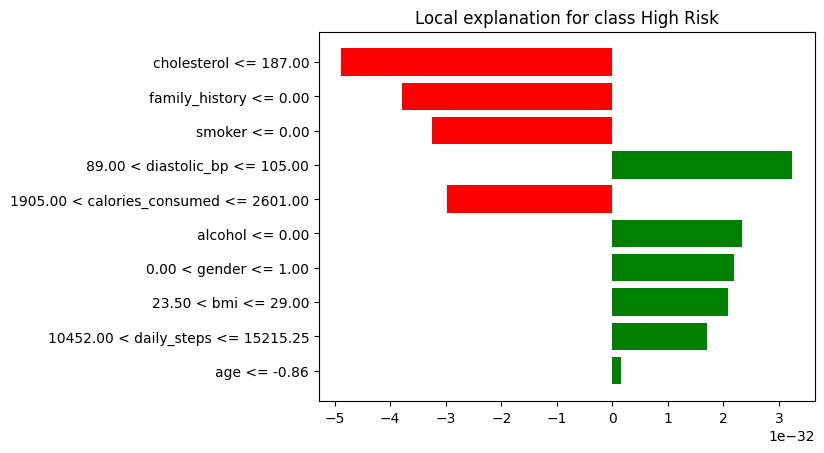

In [34]:
%matplotlib inline
fig = exp_xgb.as_pyplot_figure()

###**DECISION TREE**


In [38]:
exp_dt = lime_explainer.explain_instance(
    X_test.values[i],
    predict_fn=xgb.predict_proba,
    num_features=10
)
exp_dt.show_in_notebook(show_table=True)

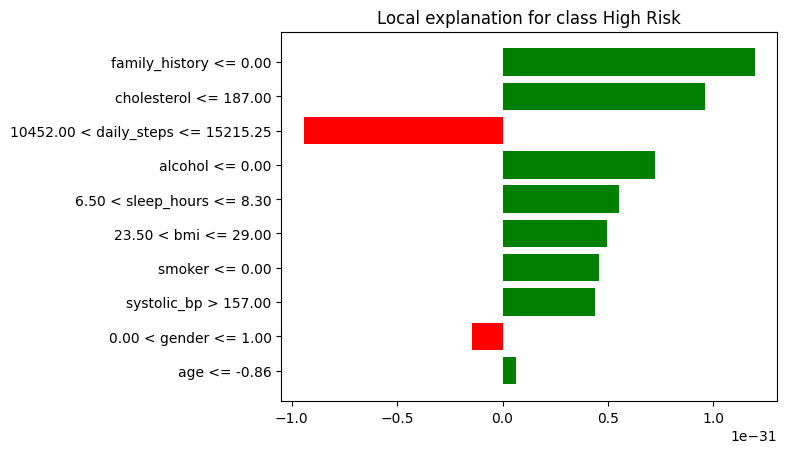

In [39]:

fig_dt = exp_dt.as_pyplot_figure()

###**Random Forest**

In [40]:
exp_rf = lime_explainer.explain_instance(
    X_test.values[i],
    predict_fn=xgb.predict_proba,
    num_features=10
)
exp_rf.show_in_notebook(show_table=True)

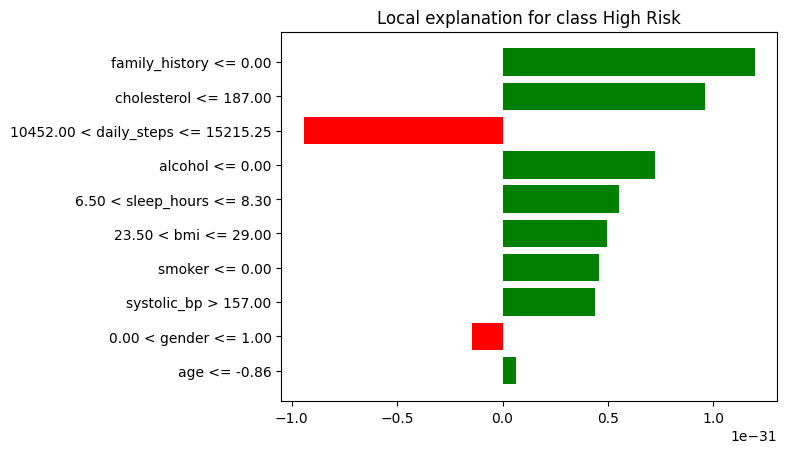

In [41]:
fig_rf = exp_dt.as_pyplot_figure()

###**CAT BOOST**

In [42]:
exp_cat = lime_explainer.explain_instance(
    X_test.values[i],
    predict_fn=xgb.predict_proba,
    num_features=10
)
exp_cat.show_in_notebook(show_table=True)

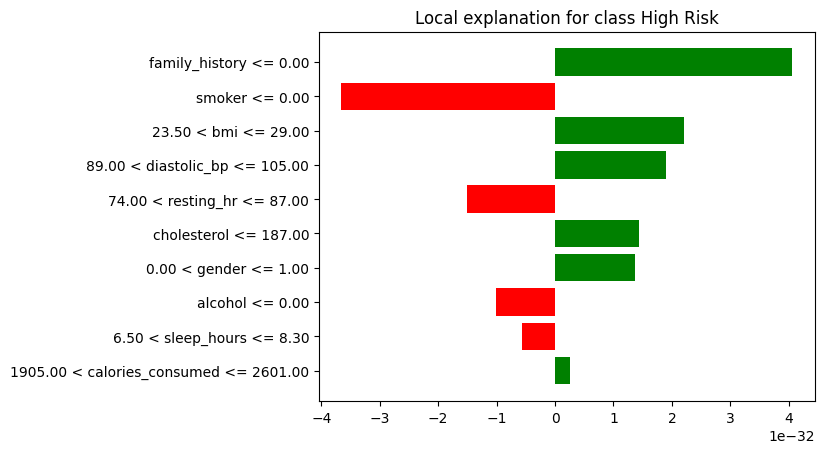

In [43]:
fig_cat = exp_cat.as_pyplot_figure()

###**LOGISTIC REGRESSION**

In [46]:
exp_lr = lime_explainer.explain_instance(
    X_test.values[i],
    predict_fn=xgb.predict_proba,
    num_features=10
)
exp_lr.show_in_notebook(show_table=True)

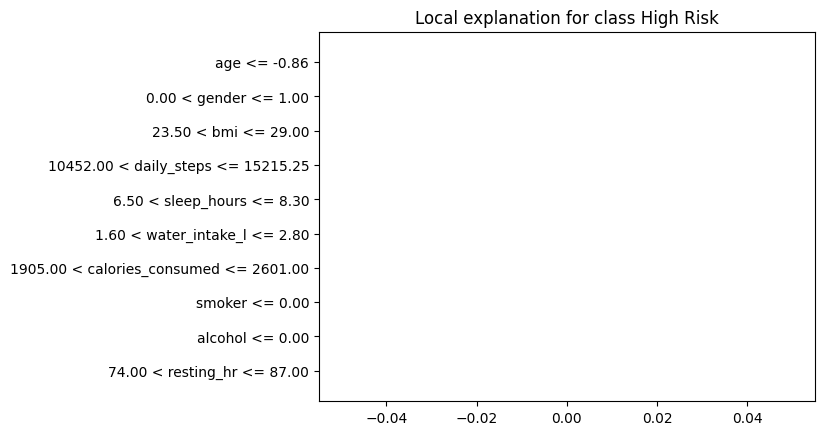

In [47]:
fig_lr= exp_lr.as_pyplot_figure()

#**ICE**

In [ ]:
!pip install ice

In [49]:
feature_index = X_train.columns.get_loc('age')
feature_name = 'age'

In [50]:
# Use the min and max values from the training data

age_min, age_max = X_train[feature_name].min(), X_train[feature_name].max()
n_points = 100 # Number of points to evaluate along the feature range
age_values = np.linspace(age_min, age_max, n_points)

In [51]:
# Select a subset of the data for ICE lines
n_ice_samples = 50 # Number of individual ICE lines to plot
sample_indices = np.random.choice(X_test.index, size=n_ice_samples, replace=False)
X_ice_samples = X_test.loc[sample_indices].copy()

###**ANN MODEL**

In [52]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []
for i in range(n_ice_samples):
    # Create a temporary DataFrame to vary the feature value while keeping others constant
    X_temp = X_ice_samples.iloc[i].to_frame().T.copy()
    X_repeated = pd.concat([X_temp] * n_points, ignore_index=True)
    X_repeated[feature_name] = age_values

    # Convert to numpy array before predicting if the model expects numpy
    X_repeated_np = X_repeated.values

    predictions = model.predict(X_repeated_np).ravel() # Get probabilities for the positive class
    ice_predictions.append(predictions)

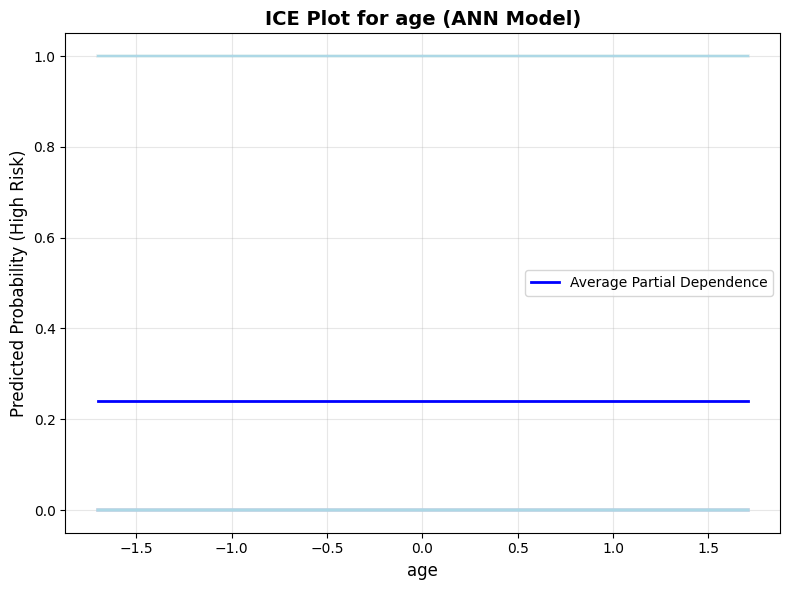

In [53]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (ANN Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

###**XGBoost MODEL**

In [54]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []
for i in range(n_ice_samples):
    # Create a temporary DataFrame to vary the feature value while keeping others constant
    X_temp = X_ice_samples.iloc[i].to_frame().T.copy()
    X_repeated = pd.concat([X_temp] * n_points, ignore_index=True)
    X_repeated[feature_name] = age_values

    # Convert to numpy array before predicting if the model expects numpy
    X_repeated_np = X_repeated.values

    predictions = xgb.predict(X_repeated_np).ravel() # Get probabilities for the positive class
    ice_predictions.append(predictions)

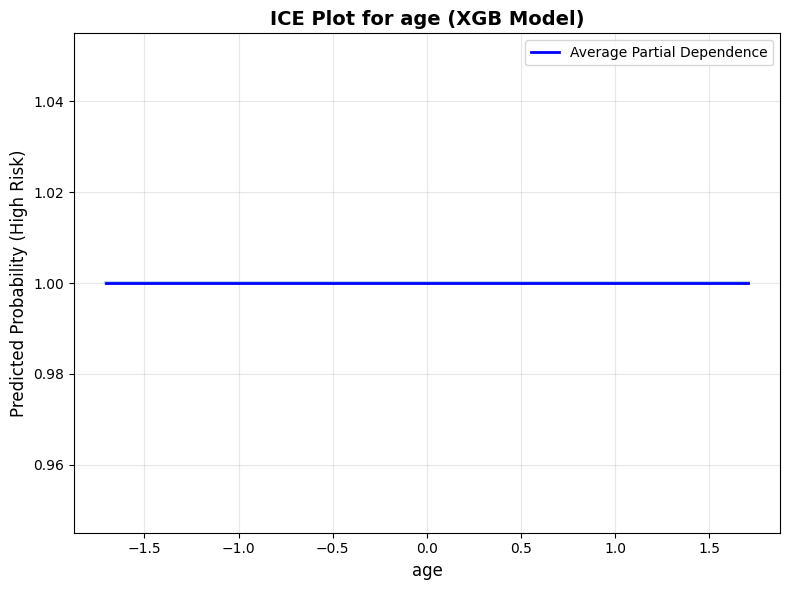

In [55]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (XGB Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

###**DECISION TREE**

In [56]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []
for i in range(n_ice_samples):
    # Create a temporary DataFrame to vary the feature value while keeping others constant
    X_temp = X_ice_samples.iloc[i].to_frame().T.copy()
    X_repeated = pd.concat([X_temp] * n_points, ignore_index=True)
    X_repeated[feature_name] = age_values

    # Convert to numpy array before predicting if the model expects numpy
    X_repeated_np = X_repeated.values

    predictions = dt.predict(X_repeated_np).ravel() # Get probabilities for the positive class
    ice_predictions.append(predictions)

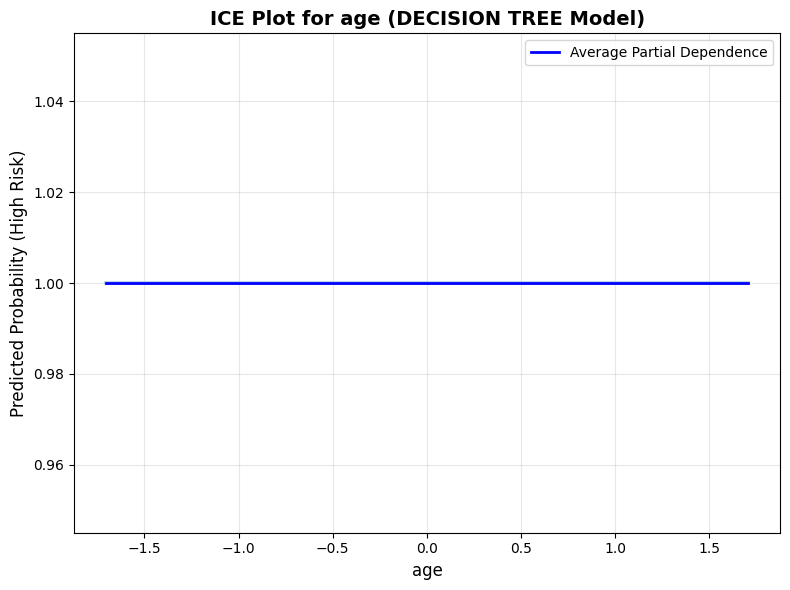

In [57]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (DECISION TREE Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

###**RANDOM FOREST**

In [58]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []
for i in range(n_ice_samples):
    # Create a temporary DataFrame to vary the feature value while keeping others constant
    X_temp = X_ice_samples.iloc[i].to_frame().T.copy()
    X_repeated = pd.concat([X_temp] * n_points, ignore_index=True)
    X_repeated[feature_name] = age_values

    # Convert to numpy array before predicting if the model expects numpy
    X_repeated_np = X_repeated.values

    predictions = rf.predict(X_repeated_np).ravel() # Get probabilities for the positive class
    ice_predictions.append(predictions)

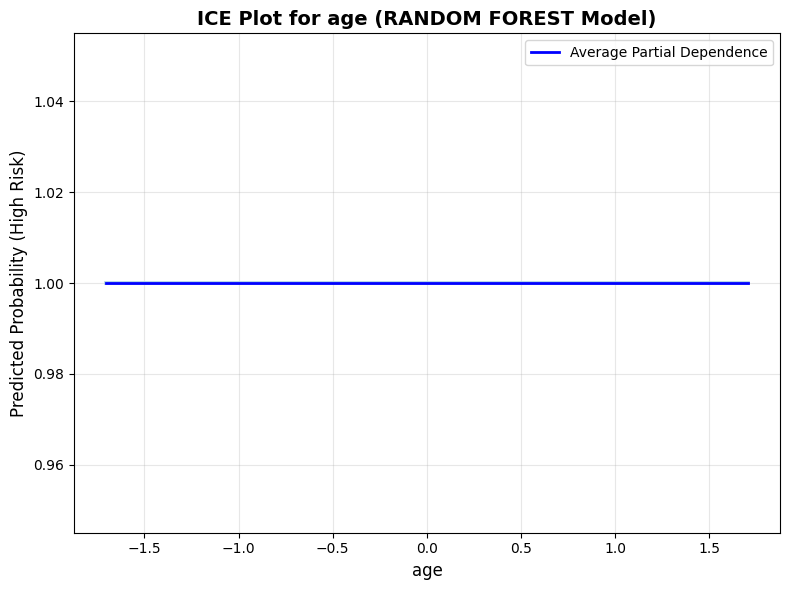

In [59]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (RANDOM FOREST Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

###**CATBOOST**

In [60]:
# Calculate predictions for each ICE sample across the feature range
ice_predictions = []
for i in range(n_ice_samples):
    # Create a temporary DataFrame to vary the feature value while keeping others constant
    X_temp = X_ice_samples.iloc[i].to_frame().T.copy()
    X_repeated = pd.concat([X_temp] * n_points, ignore_index=True)
    X_repeated[feature_name] = age_values

    # Convert to numpy array before predicting if the model expects numpy
    X_repeated_np = X_repeated.values

    predictions = cat.predict(X_repeated_np).ravel() # Get probabilities for the positive class
    ice_predictions.append(predictions)

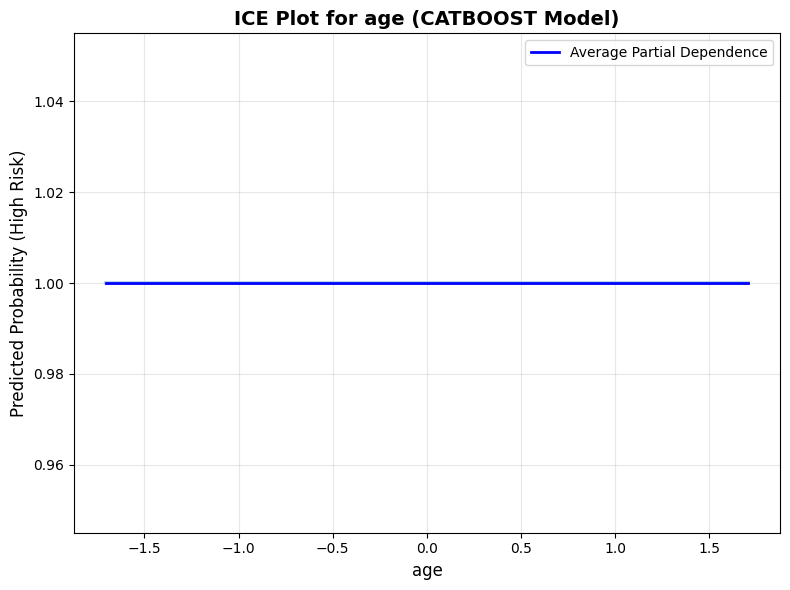

In [61]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (CATBOOST Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

###**LOGISTIC REGRESSION**

In [62]:
#Calculate predictions for each ICE sample across the feature range
ice_predictions = []
for i in range(n_ice_samples):
    # Create a temporary DataFrame to vary the feature value while keeping others constant
    X_temp = X_ice_samples.iloc[i].to_frame().T.copy()
    X_repeated = pd.concat([X_temp] * n_points, ignore_index=True)
    X_repeated[feature_name] = age_values

    # Convert to numpy array before predicting if the model expects numpy
    X_repeated_np = X_repeated.values

    predictions = lr.predict(X_repeated_np).ravel() # Get probabilities for the positive class
    ice_predictions.append(predictions)

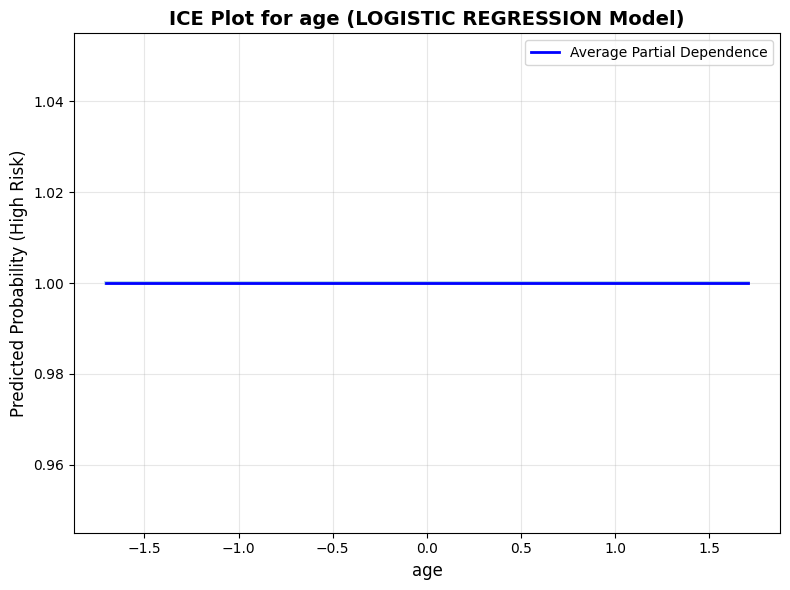

In [63]:
# Plot the ICE curves
plt.figure(figsize=(8, 6))
for predictions in ice_predictions:
    plt.plot(age_values, predictions, color='lightblue', alpha=0.5)

# Plot the average partial dependence
average_predictions = np.mean(ice_predictions, axis=0)
plt.plot(age_values, average_predictions, color='blue', linewidth=2, label='Average Partial Dependence')


plt.title(f"ICE Plot for {feature_name} (LOGISTIC REGRESSION Model)", fontsize=14, fontweight='bold')
plt.xlabel(feature_name, fontsize=12)
plt.ylabel("Predicted Probability (High Risk)", fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()